In [1]:
from voxelwise_tutorials.viz import plot_flatmap_from_mapper, _map_to_2d_cmap, plot_2d_flatmap_from_mapper
import numpy as np
import cortex
import os
import matplotlib.pyplot as plt

In [2]:
models = ['bert-text-fatma','gpt2-text-fatma', 'Wavevec_fatma']
bert_models = ['res_numletters_bert','res_numphonemes_bert','res_numwords_bert','res_diphone_bert','bert-semantic','bert-fbank','bert-mfcc', 'bert-mel', 'res_spectrpower_bert', 'res_phonological_bert', 'bert-articulation']
wav2vec_models = ['res_numletters_wav2vec','res_numphonemes_wav2vec','res_numwords_wav2vec','res_diphone_wav2vec','wav2vec-semantic','wav2vec-fbank','wav2vec-mfcc', 'wav2vec-mel', 'res_powerspec_wav2vec','res_phonological_wav2vec','wav2vec-articulation']

In [3]:
normalized_scores_main = {}
subjects = ['01','02','03','05','07','08']
for eachmodel in models:
    normalized_scores_main[eachmodel] = []
    for eachsub in subjects:
        ceiling_voxcorrs = np.load('../Noise_Ceiling/listening/subject_'+str(eachsub)+'_kernel_ridge.npy')
        temp = []
        for eachlayer in np.arange(12):
            model_voxcorrs = np.load(eachmodel+'/listening/'+str(eachsub)+'/'+str(eachlayer)+'/'+"layer_"+str(eachlayer)+'.npy')
            significant_indices = np.where(np.nan_to_num(ceiling_voxcorrs)<=0.05)[0]
            model_voxcorrs[significant_indices] = 0.0
            normalize_across_voxels = np.nan_to_num(model_voxcorrs)/np.nan_to_num(ceiling_voxcorrs)
            temp.append(normalize_across_voxels)
        normalized_scores_main[eachmodel].append(np.mean(temp,axis=0))
normalized_scores_main = np.array(list(normalized_scores_main.values()))
print(normalized_scores_main.shape)

(3, 6)


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  from ipykernel import kernelapp as app


In [4]:
normalized_scores_main_read = {}
subjects = ['01','02','03','05','07','08']
for eachmodel in models:
    normalized_scores_main_read[eachmodel] = []
    for eachsub in subjects:
        ceiling_voxcorrs = np.load('../Noise_Ceiling/reading/subject_'+str(eachsub)+'_kernel_ridge.npy')
        temp = []
        for eachlayer in np.arange(12):
            model_voxcorrs = np.load(eachmodel+'/reading/'+str(eachsub)+'/'+str(eachlayer)+'/'+"layer_"+str(eachlayer)+'.npy')
            significant_indices = np.where(np.nan_to_num(ceiling_voxcorrs)<=0.05)[0]
            model_voxcorrs[significant_indices] = 0.0
            normalize_across_voxels = np.nan_to_num(model_voxcorrs)/np.nan_to_num(ceiling_voxcorrs)
            temp.append(normalize_across_voxels)
        normalized_scores_main_read[eachmodel].append(np.mean(temp,axis=0))
normalized_scores_main_read = np.array(list(normalized_scores_main_read.values()))
print(normalized_scores_main_read.shape)

(3, 6)


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  from ipykernel import kernelapp as app


In [5]:
normalized_scores_res_wav2vec = {}
subjects = ['01','02','03','05','07','08']
for eachmodel in wav2vec_models:
    normalized_scores_res_wav2vec[eachmodel] = []
    for eachsub in subjects:
        temp = []
        for eachlayer in np.arange(7):
            model_voxcorrs = np.load('../Predictions/'+eachmodel.lower()+'/listening/'+str(eachsub)+'/'+str(eachlayer)+'/'+"layer_"+str(eachlayer)+'.npy')
            ceiling_voxcorrs = np.load('../Noise_Ceiling/listening/subject_'+str(eachsub)+'_kernel_ridge.npy')
            #significant_indices = np.where(np.nan_to_num(ceiling_voxcorrs)>0.05)[0]
            significant_indices = np.where(np.nan_to_num(ceiling_voxcorrs)<=0.05)[0]
            model_voxcorrs[significant_indices] = 0.0
            normalize_across_voxels = np.nan_to_num(model_voxcorrs)/np.nan_to_num(ceiling_voxcorrs)
            temp.append(normalize_across_voxels)
        normalized_scores_res_wav2vec[eachmodel].append(np.mean(temp,axis=0))
normalized_scores_res_wav2vec = np.array(list(normalized_scores_res_wav2vec.values()))
print(normalized_scores_res_wav2vec.shape)

(11, 6)


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  app.launch_new_instance()


# Voxels 2D Colormaps

In [6]:
from voxelwise_tutorials.viz import plot_2d_flatmap_from_mapper, plot_flatmap_from_mapper

In [ ]:
for i in np.arange(6):
    directory = '../'
    mapper_file = os.path.join(directory, "mappers", f"subject{subjects[i]}_mappers.hdf")
    ax = plot_flatmap_from_mapper(normalized_scores_res_wav2vec[9][i],
                                 mapper_file, cmap='RdBu_r',vmin=-0.2, vmax=0.3)


In [ ]:
plt.rcParams.update({'font.size':16})
for i in np.arange(6):
    directory = '../'
    mapper_file = os.path.join(directory, "mappers", f"subject{subjects[i]}_mappers.hdf")
    ax = plot_2d_flatmap_from_mapper(normalized_scores_main[3][i], normalized_scores_res_wav2vec[9][i],
                                 mapper_file, label_1='Wav2Vec2.0',vmin=0.0, vmax=0.4, vmin2=0.0, vmax2=0.2,
                                 label_2='Wav2Vec2.0-Phonological',colorbar_location=(.35, .835, .3, .2))
    plt.savefig('residuals_wav2vec_phonological_normalized_2dcolormap_'+subjects[i]+'.jpg')
    #plt.show()

In [ ]:
count = 0
for eachsub in ['01','02','03','05','07','08']:
    subject = eachsub
    directory = '../mappers/'
    mapper_file = os.path.join(directory, f'subject{subject}_mappers.hdf')
    ax = plot_flatmap_from_mapper(normalized_scores_res_wav2vec[8][count], mapper_file, vmin=0, vmax=1, with_rois=True)
    plt.savefig('wav2vec_phonological_normalized_2dcolormap_'+subjects[i]+'.jpg')
    #plt.show()
    count+=1

<ipython-input-10-83dfb979722e>:4: RuntimeWarning: invalid value encountered in true_divide
  ax = plot_flatmap_from_mapper(((np.nan_to_num(normalized_scores_main[3][i])-np.nan_to_num(normalized_scores_res_wav2vec[9][i]))/np.nan_to_num(normalized_scores_main[3][i]))*100,


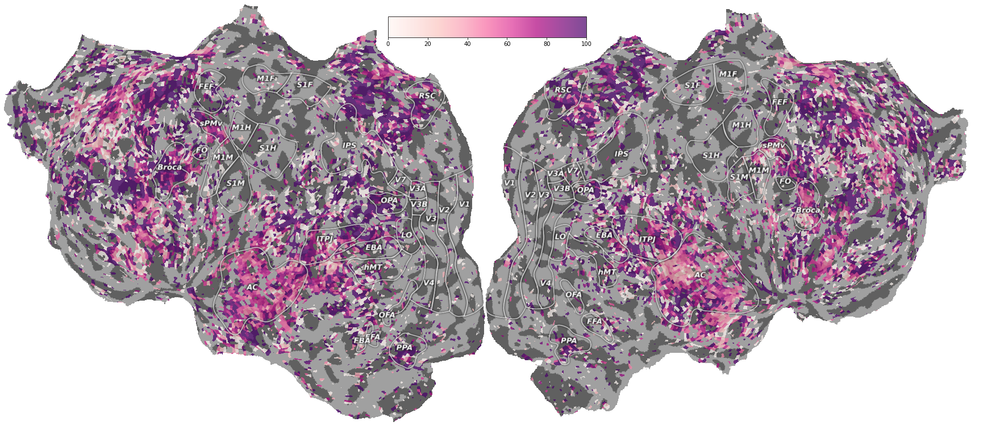

In [10]:
for i in np.arange(5,6):
    directory = '../'
    mapper_file = os.path.join(directory, "mappers", f"subject{subjects[i]}_mappers.hdf")
    ax = plot_flatmap_from_mapper(((np.nan_to_num(normalized_scores_main[3][i])-np.nan_to_num(normalized_scores_res_wav2vec[9][i]))/np.nan_to_num(normalized_scores_main[3][i]))*100,
                                 mapper_file, cmap='RdPu',vmin=0, vmax=100, colorbar_location=(.387, .92, .2, .05))
    
    plt.savefig('percentage_wav2vec_phonological_new_normalized_2dcolormap_'+subjects[i]+'.jpg',bbox_inches='tight')

<ipython-input-8-4870d7455401>:6: RuntimeWarning: invalid value encountered in true_divide
  ax = plot_flatmap_from_mapper(((normalized_scores_main_read[0][i]-normalized_scores_res_bert[3][i])/normalized_scores_main_read[0][i])*100,


<Figure size 576x432 with 0 Axes>

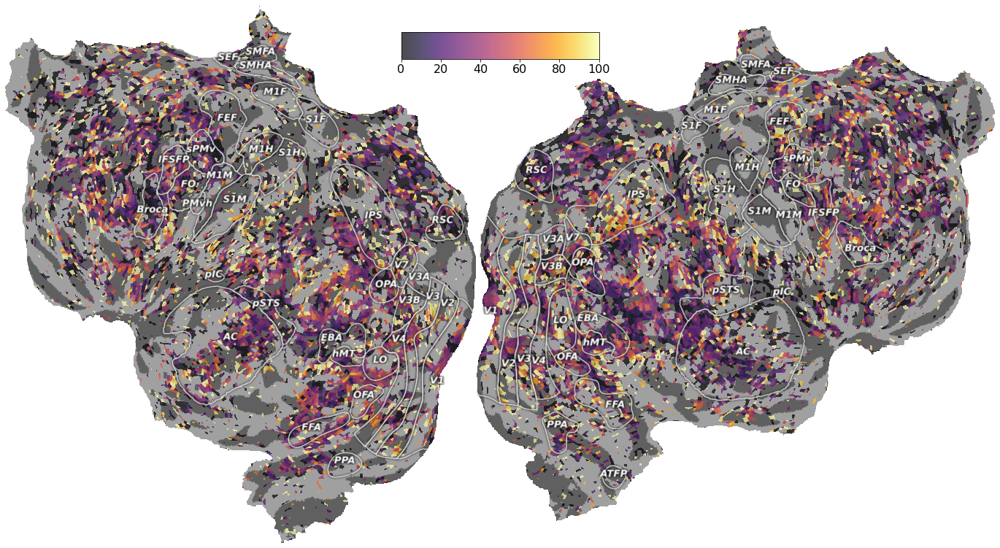

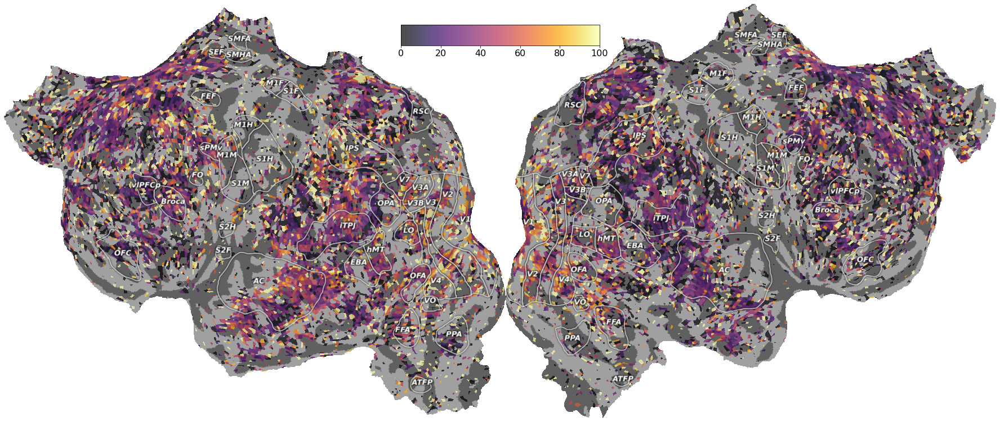

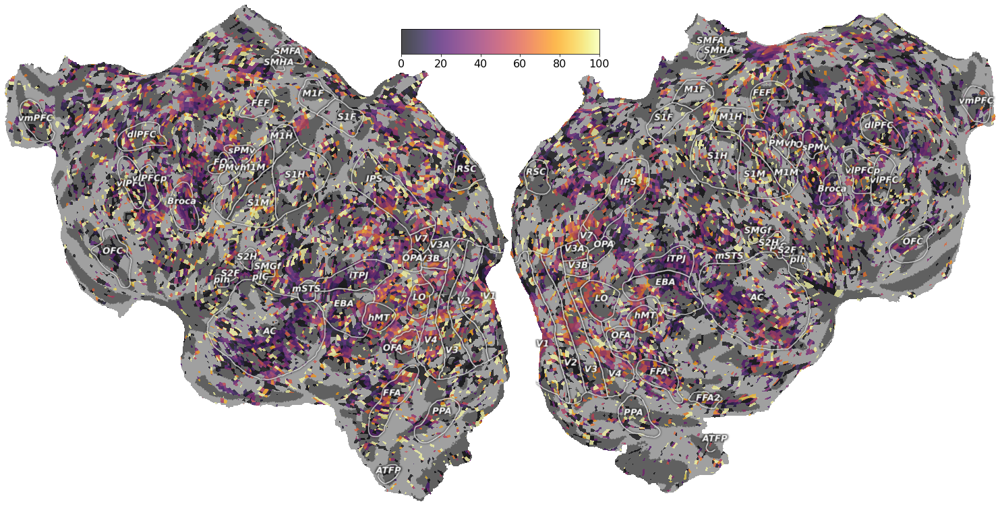

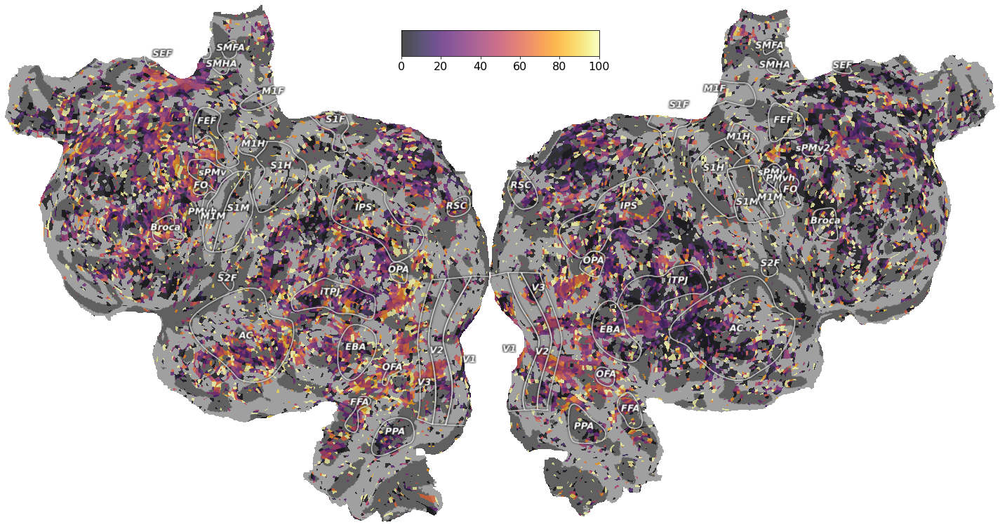

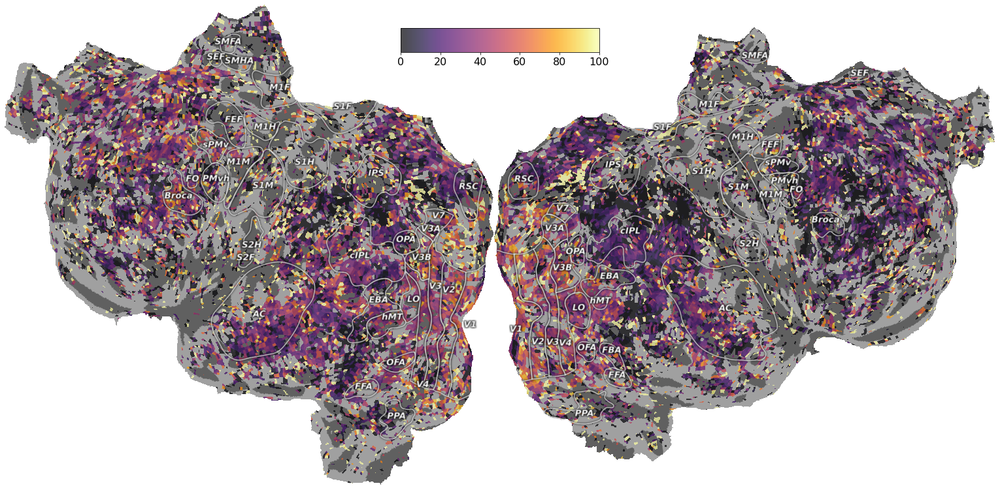

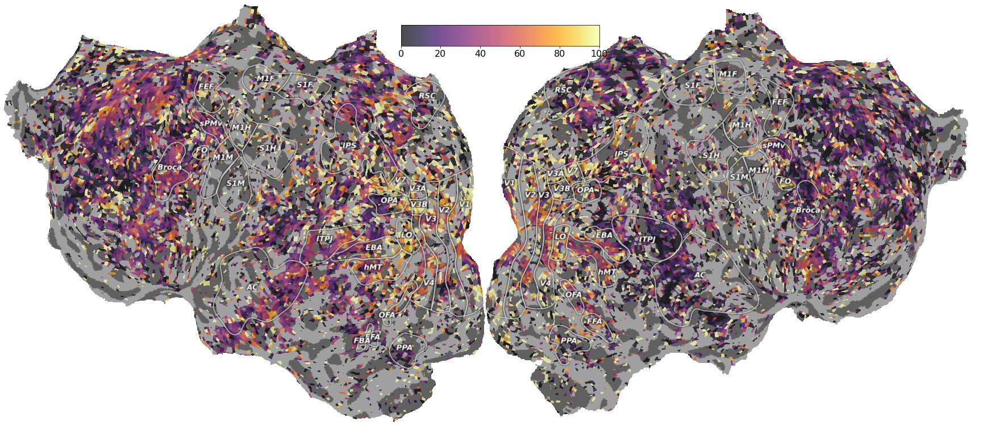

In [8]:
plt.figure(figsize=(8,6))
plt.rcParams.update({'font.size':16})
for i in np.arange(6):
    directory = '../'
    mapper_file = os.path.join(directory, "mappers", f"subject{subjects[i]}_mappers.hdf")
    ax = plot_flatmap_from_mapper(((normalized_scores_main_read[0][i]-normalized_scores_res_bert[3][i])/normalized_scores_main_read[0][i])*100,
                                 mapper_file, cmap='inferno',vmin=0, vmax=100)
    #plt.savefig('percentage_bert_diphone_normalized_2dcolormap_'+subjects[i]+'.jpg', bbox_inches='tight')

<ipython-input-9-f43587fdbb33>:6: RuntimeWarning: invalid value encountered in true_divide
  ax = plot_flatmap_from_mapper(((normalized_scores_main_read[0][i]-normalized_scores_res_bert[0][i])/normalized_scores_main_read[0][i])*100,
<ipython-input-9-f43587fdbb33>:6: RuntimeWarning: invalid value encountered in true_divide
  ax = plot_flatmap_from_mapper(((normalized_scores_main_read[0][i]-normalized_scores_res_bert[0][i])/normalized_scores_main_read[0][i])*100,
<ipython-input-9-f43587fdbb33>:6: RuntimeWarning: invalid value encountered in true_divide
  ax = plot_flatmap_from_mapper(((normalized_scores_main_read[0][i]-normalized_scores_res_bert[0][i])/normalized_scores_main_read[0][i])*100,
<ipython-input-9-f43587fdbb33>:6: RuntimeWarning: invalid value encountered in true_divide
  ax = plot_flatmap_from_mapper(((normalized_scores_main_read[0][i]-normalized_scores_res_bert[0][i])/normalized_scores_main_read[0][i])*100,
<ipython-input-9-f43587fdbb33>:6: RuntimeWarning: invalid value enco

<Figure size 576x432 with 0 Axes>

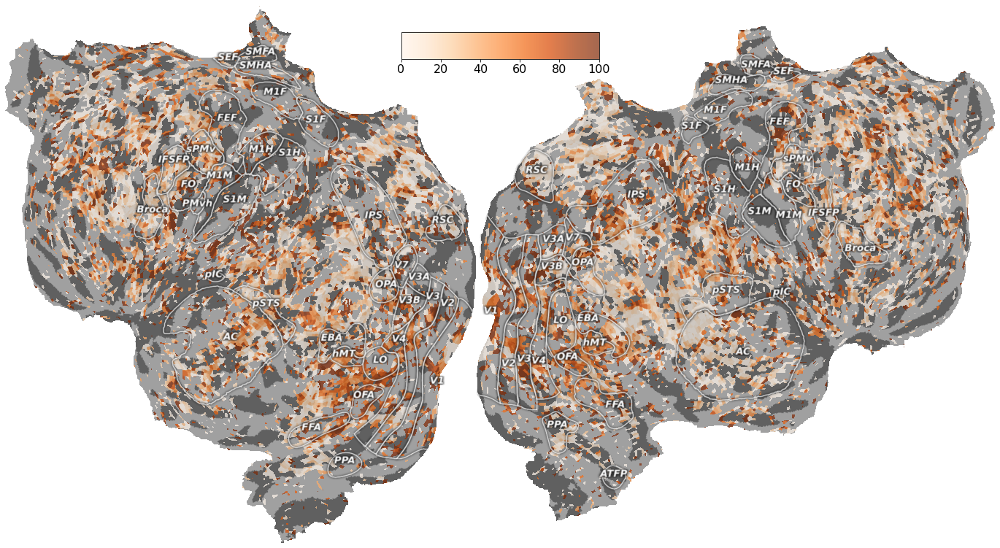

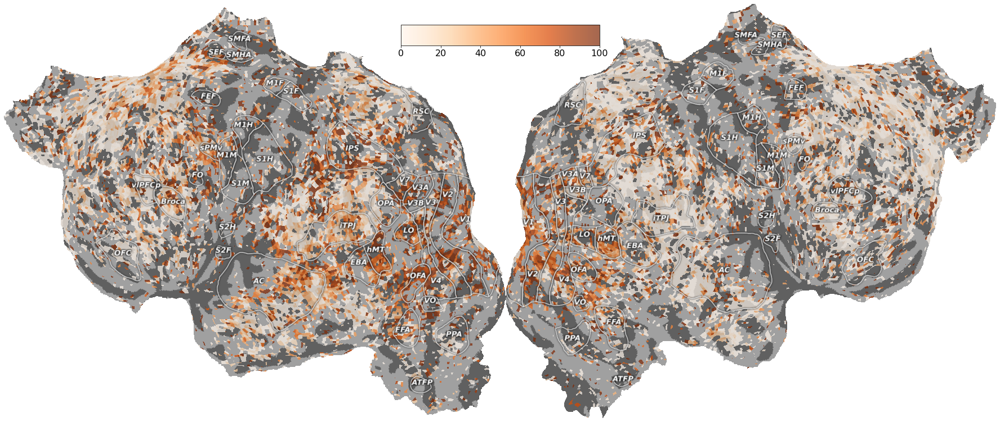

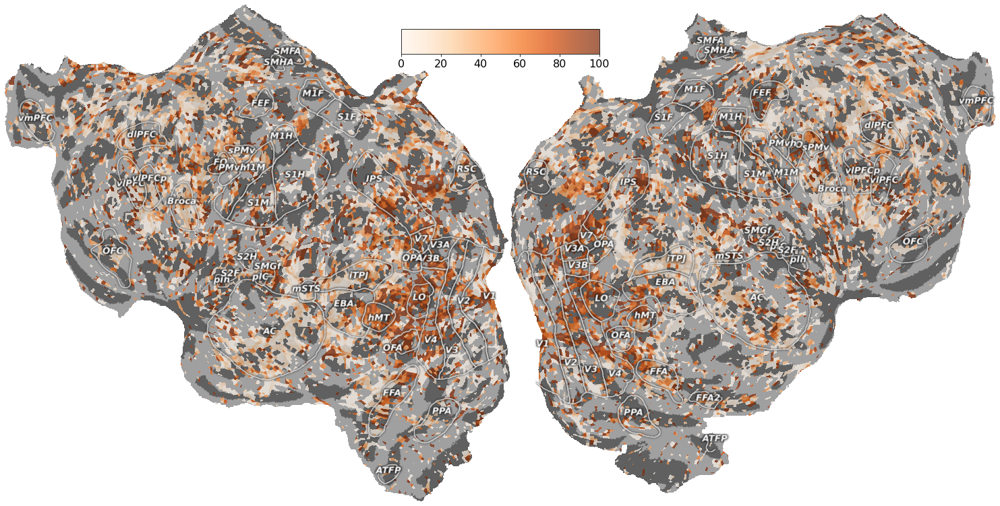

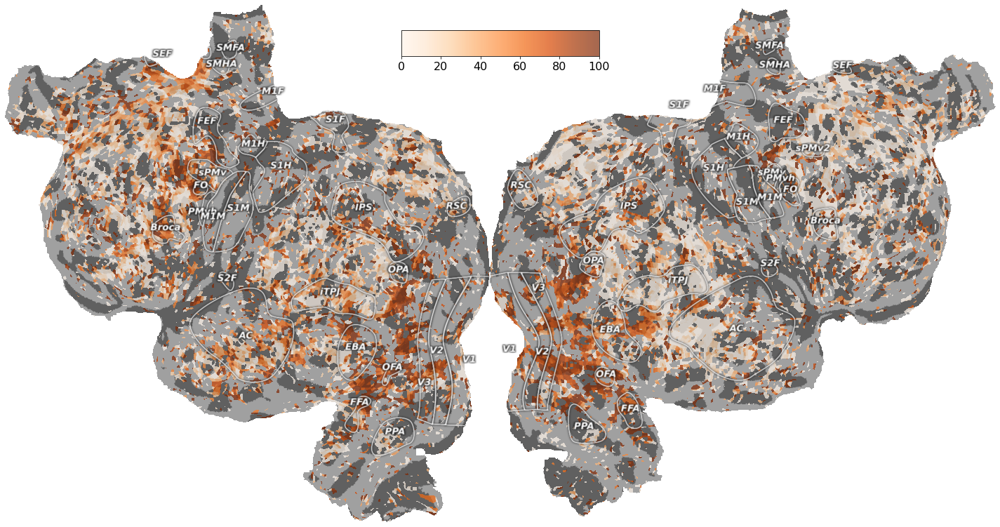

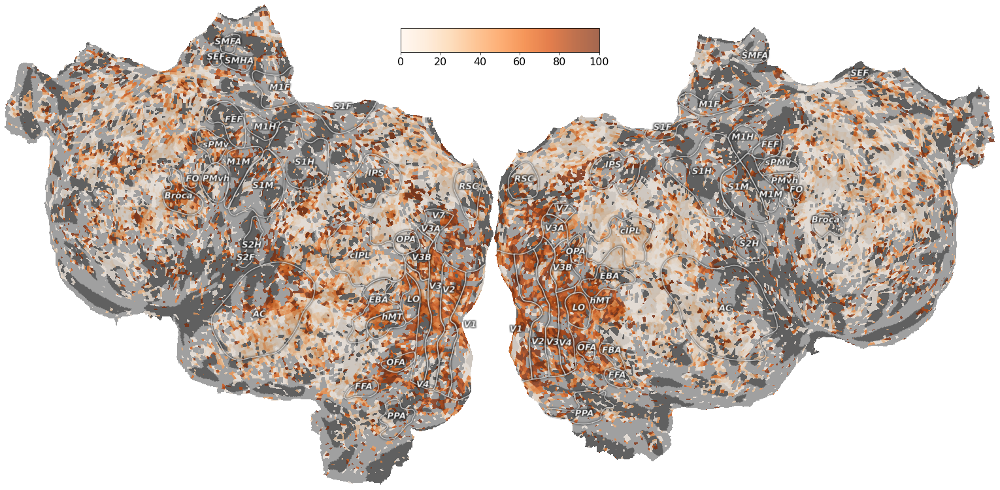

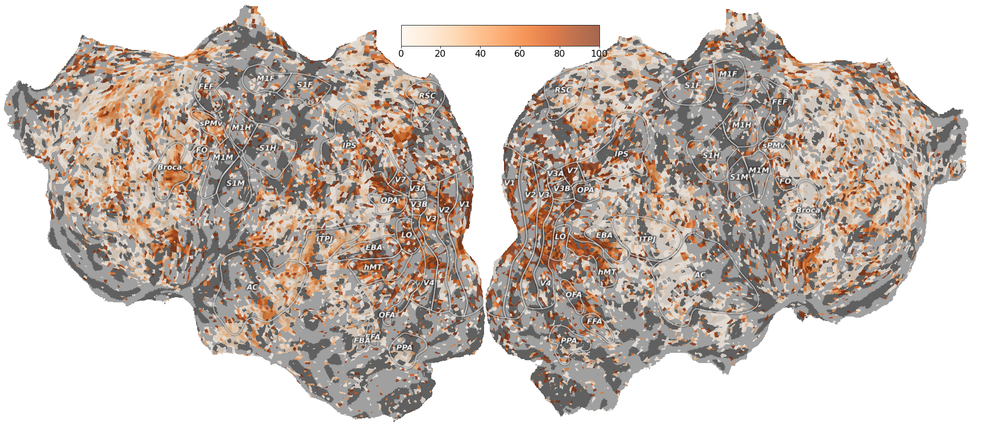

In [9]:
plt.figure(figsize=(8,6))
plt.rcParams.update({'font.size':16})
for i in np.arange(6):
    directory = '../'
    mapper_file = os.path.join(directory, "mappers", f"subject{subjects[i]}_mappers.hdf")
    
    ax = plot_flatmap_from_mapper(((normalized_scores_main_read[0][i]-normalized_scores_res_bert[0][i])/normalized_scores_main_read[0][i])*100,
                                 mapper_file, cmap='Oranges',vmin=0, vmax=100)
    plt.savefig('percentage_bert_numletters_normalized_2dcolormap_'+subjects[i]+'.jpg')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


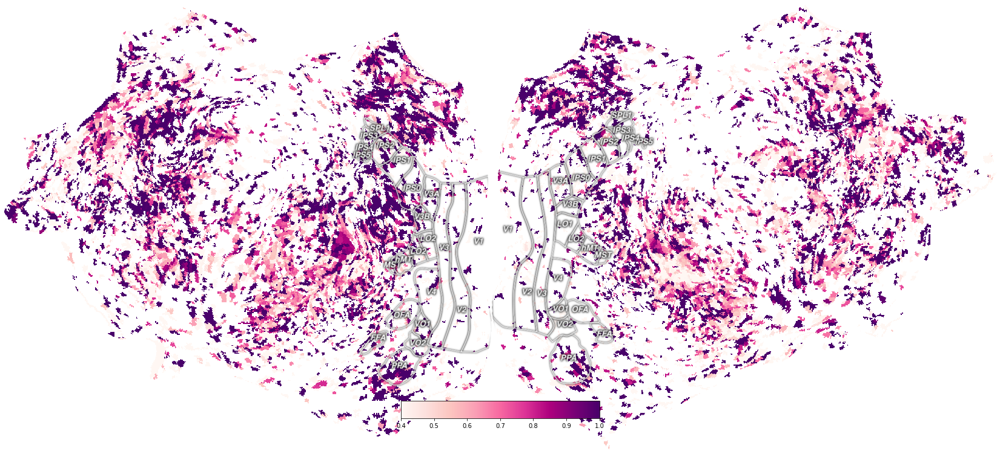

In [48]:
from voxelwise_tutorials.io import load_hdf5_sparse_array
for i in np.arange(5,6):
    directory = './'
    mapper_file = os.path.join(directory, "mappers", f"subject{subjects[i]}_mappers.hdf")
    voxel_to_fsaverage = load_hdf5_sparse_array(mapper_file, key='voxel_to_fsaverage')
    subject_scores_listening = ((normalized_scores_main[2][i]-normalized_scores_res_wav2vec[9][i])/normalized_scores_main[2][i])
    proj_voxels = voxel_to_fsaverage @ subject_scores_listening
    #proj_voxels[np.where(proj_voxels< 0.4)[0]] = np.nan
    #ax = plot_flatmap_from_mapper(((np.nan_to_num(normalized_scores_main[2][i])-np.nan_to_num(normalized_scores_res_wav2vec[9][i]))/np.nan_to_num(normalized_scores_main[2][i]))*100,
    #                            mapper_file, cmap='RdPu',vmin=0, vmax=100, colorbar_location=(.387, .92, .2, .05))
    vertex_data = cortex.Vertex(proj_voxels,'fsaverage',vmin=0.4,vmax=1,cmap="RdPu",with_labels=False, nanmean=True)
    cortex.quickshow(vertex_data)
    plt.show()
    break
    #plt.savefig('percentage_wav2vec_phonological_new_normalized_2dcolormap_'+subjects[i]+'.jpg',bbox_inches='tight')

In [42]:
cortex.webgl.show(data=vertex_data)

Started server on port 64078


<JS: window.viewer>

Stopping server


In [8]:
# this opens a new tab and then saves the lateral and medial views
list_angles = ['left', 'right', 'medial_pivot']
cortex.export.save_3d_views(volume=vertex_data,
                    base_name='./wave2vecres',
                    list_angles=list_angles,
                    list_surfaces=['inflated'] * len(list_angles),
                    viewer_params=dict(labels_visible=[],
                        overlays_visible=[],
                        linewidth=3))

Started server on port 39515
{'camera.azimuth': 90, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 0, 'surface.{subject}.shift': 0, 'surface.{subject}.specularity': 0}
[Errno 2] No such file or directory: 'convert': 'convert'
{'camera.azimuth': 270, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 0, 'surface.{subject}.shift': 0, 'surface.{subject}.specularity': 0}
[Errno 2] No such file or directory: 'convert': 'convert'
{'camera.azimuth': 0, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 180, 'surface.{subject}.shift': 10, 'surface.{subject}.specularity': 0}
[Errno 2] No such file or directory: 'convert': 'convert'
Stopping server


['./wave2vecres_left_inflated.png',
 './wave2vecres_right_inflated.png',
 './wave2vecres_medial_pivot_inflated.png']